In [43]:
import matplotlib.pyplot as plt 
import numpy as np 
import pandas as pd
import random, os
import torch 
import torchvision.transforms as transforms 
import torch.nn as nn 
import torch.nn.functional as F
import torch.optim as optim 
from concurrent.futures import ThreadPoolExecutor
from sklearn.model_selection import KFold
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
#os.environ['CUDA_VISIBLE_DEVICES'] ='0'
#DEVICE = "cuda"


In [44]:
#model parameters and variables
# E(Pr) = Pt + Co - (aw) - 10nlog(d)
''' Pr -> Received power
    Pt -> transmitted power
    Co -> E(S) + E(H) - (loss_upto_1m)
    a -> attenuation provided by walls
    w -> no of walls
    d -> distance b/w Rx and Tx
    S -> shadowing rv
    H -> fading rv
    Rate_walls -> rate of walls
'''
a = 6
n = 3
Co = -40
Pt = 20
Rate_walls = 0.25
Es, Eh = 0, 0

In [45]:
# Training_data generation function
def generate_train_data(i):
    d = random.uniform(1, 30)
    w = np.random.poisson(Rate_walls * d)
    Pr = Pt + Co - a * w - 10 * n * np.log(d)
    return [Pt, d, w, Pr]

# Test_data generation function
def generate_test_data(i):
    d = random.uniform(1, 30)
    w = np.random.poisson(Rate_walls * d)
    Pr = Pt + Co - a * w - 10 * n * np.log(d)
    return [Pt, d, w, Pr]

# Parallelize data generation
def parallel_data_generation(generator_func, num_samples):
    with ThreadPoolExecutor() as executor:
        results = list(executor.map(generator_func, range(num_samples)))
    return pd.DataFrame(results, columns=['Pt', 'd', 'w', 'Pr'])

# Generate training data in parallel
train_data = parallel_data_generation(generate_train_data, 150000)

# Generate test data in parallel
test_data = parallel_data_generation(generate_test_data, 20000)

# Display sample rows
print("Training data:")
print(train_data)

print("\nTest data:")
print(test_data)

Training data:
        Pt          d  w          Pr
0       20  25.275870  2 -128.895506
1       20   7.876714  4 -105.917323
2       20   2.101300  0  -42.276687
3       20  11.873555  4 -118.229409
4       20   1.078378  0  -22.263749
...     ..        ... ..         ...
149995  20  27.552313  5 -149.482595
149996  20  23.267831  7 -156.412153
149997  20  29.736875  7 -163.771636
149998  20  11.554776  1  -99.412965
149999  20   4.215162  0  -63.160641

[150000 rows x 4 columns]

Test data:
       Pt          d  w          Pr
0      20  24.382554  7 -157.816036
1      20   1.126949  1  -29.585414
2      20  11.961455  4 -118.450683
3      20   4.064467  2  -74.068479
4      20  29.838620  4 -145.874106
...    ..        ... ..         ...
19995  20   5.751263  2  -84.482584
19996  20   9.686886  1  -94.123191
19997  20  14.580662  4 -124.390884
19998  20  17.832311  5 -136.430362
19999  20  23.503732  6 -150.714776

[20000 rows x 4 columns]


In [46]:
# #training data
# def gen_train(Pt):
#     df_train = pd.DataFrame()
#     df_train['Pt'] = []
#     df_train['d'] = []
#     df_train['w'] = []
#     df_train['Pr'] = []
#     np.random.seed(0)
#     for i in range (0, 150000):  
        
#         # d follows U(1m, 30m) and w follows poisson(rate_walls * d)
#         d = random.uniform(1, 30)
#         w = np.random.poisson(Rate_walls * d)
#         Pr = Pt + Co - a*w -10*n*np.log(d)
#         df_train.loc[i] = [Pt, d, w, Pr]
#     return(df_train)


# #test data
# def gen_test(Pt):
#     df_test = pd.DataFrame()
#     df_test['Pt'] = []
#     df_test['d'] = []
#     df_test['w'] = []
#     df_test['Pr']=[]
#     np.random.seed(1)
#     for i in range (0, 20000):
#         d = random.uniform(1, 30)self.model.to('cuda')
#         w = np.random.poisson(Rate_walls * d)
#         Pr = Pt + Co - a*w - 10*n*np.log(d)
#         df_test.loc[i] = [Pt, d, w, Pr]
#     return(df_test)


In [47]:
#DNN

class NN(nn.Module):
    def __init__(self, input_size, num_classes):
        super(NN, self).__init__()
        self.fc1 = nn.Linear(input_size, 200)
        self.fc2 = nn.Linear(200, 155)
        self.fc3 = nn.Linear(155, 50)
        self.fc4 = nn.Linear(50, num_classes)


    def forward(self, x):
        # x = torch.flatten(x, 1)
        x = F.tanh(self.fc1(x))
        x = F.tanh(self.fc2(x))
        x = F.tanh(self.fc3(x))
        x = self.fc4(x)
        return(x)
    
input_size, num_classes = 3, 1
net = NN(input_size=input_size, num_classes=num_classes).to(DEVICE)
print(net)

NN(
  (fc1): Linear(in_features=3, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=155, bias=True)
  (fc3): Linear(in_features=155, out_features=50, bias=True)
  (fc4): Linear(in_features=50, out_features=1, bias=True)
)


In [48]:
#hyper-parameters
lr = 3e-4
batch_size = 32
epochs = 10

In [49]:
#loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr = lr)

In [50]:
#load train and test data
df_train = train_data
df_test = test_data

# defining a class to get training and testing datasets from dataframes
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe):
        #The features are all columns except the last one
        self.features = torch.tensor(dataframe.iloc[:, :-1].values, dtype=torch.float32).to(DEVICE) 

        #labels are the last column   
        self.labels = torch.tensor(dataframe.iloc[:, -1].values, dtype=torch.float32).to(DEVICE)

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return {'features': self.features[idx], 'labels': self.labels[idx]}

traindata = CustomDataset(df_train)
trainloader = torch.utils.data.DataLoader(traindata, batch_size=batch_size, shuffle=False)

testdata = CustomDataset(df_test)
testloader = torch.utils.data.DataLoader(testdata, batch_size=batch_size, shuffle=False)
print(df_test)
print(df_train)

       Pt          d  w          Pr
0      20  24.382554  7 -157.816036
1      20   1.126949  1  -29.585414
2      20  11.961455  4 -118.450683
3      20   4.064467  2  -74.068479
4      20  29.838620  4 -145.874106
...    ..        ... ..         ...
19995  20   5.751263  2  -84.482584
19996  20   9.686886  1  -94.123191
19997  20  14.580662  4 -124.390884
19998  20  17.832311  5 -136.430362
19999  20  23.503732  6 -150.714776

[20000 rows x 4 columns]
        Pt          d  w          Pr
0       20  25.275870  2 -128.895506
1       20   7.876714  4 -105.917323
2       20   2.101300  0  -42.276687
3       20  11.873555  4 -118.229409
4       20   1.078378  0  -22.263749
...     ..        ... ..         ...
149995  20  27.552313  5 -149.482595
149996  20  23.267831  7 -156.412153
149997  20  29.736875  7 -163.771636
149998  20  11.554776  1  -99.412965
149999  20   4.215162  0  -63.160641

[150000 rows x 4 columns]


In [51]:
for batch in testloader:
    features_batch, labels_batch = batch['features'], batch['labels']
    # Your training code goes here using features_batch and labels_batch
    print("Features Batch:")
    print(features_batch.unsqueeze(1))
    print("Labels Batch:")
    print(labels_batch.unsqueeze(1))
    break  # Break after processing the first batch as an example

Features Batch:
tensor([[[20.0000, 24.3826,  7.0000]],

        [[20.0000,  1.1269,  1.0000]],

        [[20.0000, 11.9615,  4.0000]],

        [[20.0000,  4.0645,  2.0000]],

        [[20.0000, 29.8386,  4.0000]],

        [[20.0000, 20.8530,  6.0000]],

        [[20.0000, 25.9590,  2.0000]],

        [[20.0000,  2.0033,  2.0000]],

        [[20.0000,  3.1424,  1.0000]],

        [[20.0000, 20.4514,  3.0000]],

        [[20.0000, 18.4525,  6.0000]],

        [[20.0000, 21.9983,  3.0000]],

        [[20.0000, 27.3401,  4.0000]],

        [[20.0000, 15.2552,  7.0000]],

        [[20.0000,  8.9780,  1.0000]],

        [[20.0000, 21.2870,  2.0000]],

        [[20.0000, 11.5467,  1.0000]],

        [[20.0000,  2.6977,  0.0000]],

        [[20.0000,  5.9580,  1.0000]],

        [[20.0000, 13.1632,  5.0000]],

        [[20.0000, 15.8734,  4.0000]],

        [[20.0000, 14.1712,  5.0000]],

        [[20.0000, 23.2144,  5.0000]],

        [[20.0000, 22.3011,  7.0000]],

        [[20.0000, 10.35

In [52]:
def trainer(epochs, trainloader):
    for epoch in range(epochs):
        i=0
        running_loss =0.0
        for data in trainloader:
            inputs, labels = data['features'].to(DEVICE) , data['labels'].unsqueeze(1).to(DEVICE)

            optimizer.zero_grad()

            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            #print statistics
            running_loss += abs(loss.item())
            if i % 1000 == 999:   
                print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 1000:.3f}')
                running_loss=0.0 
            i+=1


In [53]:
def accuracy(epochs, trainloader, testloader):
    trainer(epochs, trainloader)
    #saving
    PATH = './cifar_net.pth'
    torch.save(net.state_dict(), PATH)

    #accuracy
    error=0.0
    err_abs=0.0
    with torch.no_grad():
        for data in testloader:
            test, labels =  data['features'].unsqueeze(1), data['labels'].unsqueeze(1)
        # calculate outputs by running data through the network
            outputs = net(test)
            predicted = outputs.data
            diff = torch.abs(predicted - labels.unsqueeze(1))
            print(diff)
            z = torch.divide(diff, torch.abs(labels.unsqueeze(1)))
            # print(z)
            error+=z.sum().item()
            err_abs+=((torch.abs(predicted-labels.unsqueeze(1)))).sum().item()
            
    print(error/200, '%')
    print(err_abs/20000)
    # print(f'Accuracy of the network on the 20k sample data: {100 * correct // total} %')   

In [54]:
accuracy(epochs, trainloader, testloader)


[1,  1000] loss: 12904.071
[1,  2000] loss: 10046.131
[1,  3000] loss: 7635.440
[1,  4000] loss: 5702.935
[2,  1000] loss: 3397.982
[2,  2000] loss: 2536.304
[2,  3000] loss: 1916.160
[2,  4000] loss: 1064.756
[3,  1000] loss: 435.466
[3,  2000] loss: 260.902
[3,  3000] loss: 146.662
[3,  4000] loss: 81.678
[4,  1000] loss: 29.390
[4,  2000] loss: 17.661
[4,  3000] loss: 10.732
[4,  4000] loss: 5.989
[5,  1000] loss: 2.496
[5,  2000] loss: 1.491
[5,  3000] loss: 1.154
[5,  4000] loss: 0.725
[6,  1000] loss: 0.417
[6,  2000] loss: 0.277
[6,  3000] loss: 0.245
[6,  4000] loss: 0.208
[7,  1000] loss: 0.133
[7,  2000] loss: 0.105
[7,  3000] loss: 0.123
[7,  4000] loss: 0.122
[8,  1000] loss: 0.129
[8,  2000] loss: 0.038
[8,  3000] loss: 0.072
[8,  4000] loss: 0.081
[9,  1000] loss: 0.088
[9,  2000] loss: 0.032
[9,  3000] loss: 0.065
[9,  4000] loss: 0.072
[10,  1000] loss: 0.070
[10,  2000] loss: 0.041
[10,  3000] loss: 0.058
[10,  4000] loss: 0.053
tensor([[[0.1752]],

        [[0.3945]],

In [55]:
print(len(trainloader))

4688


In [56]:
def trainer_set1(epochs, trainloader):
    for epoch in range(epochs):
        i=0
        running_loss =0.0
        for data in trainloader:
            if(i>=1172):
                inputs, labels = data['features'].to(DEVICE) , data['labels'].unsqueeze(1).to(DEVICE)
            
                optimizer.zero_grad()

                outputs = net(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                #print statistics
                running_loss += abs(loss.item())
                if i % 1000 == 999:   
                    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 1000:.3f}')
                    running_loss=0.0 
            i+=1


def accuracy_set1(epochs, trainloader, testloader):
    trainer_set1(epochs, trainloader)
    #saving
    PATH = './cifar_net.pth'
    torch.save(net.state_dict(), PATH)
    i=0
    #accuracy
    error=0.0
    errorabs=0.0
    with torch.no_grad():
        for data in testloader:
            if(i<1172):
                test, labels =  data['features'].unsqueeze(1), data['labels'].unsqueeze(1)
                # calculate outputs by running data through the network
                outputs = net(test)
                predicted = outputs.data
                diff = torch.abs(predicted - labels.unsqueeze(1))
                print(diff)
                z = torch.divide(diff, torch.abs(labels.unsqueeze(1)))
                # print(z)
                error+=z.sum().item()
                errorabs+=((torch.abs(predicted-labels.unsqueeze(1)))).sum().item()
            i+=1
    print(errorabs/112500)
   

accuracy_set1(epochs, trainloader, trainloader)

[1,  2000] loss: 0.035
[1,  3000] loss: 0.058
[1,  4000] loss: 0.045
[2,  2000] loss: 0.037
[2,  3000] loss: 0.051
[2,  4000] loss: 0.044
[3,  2000] loss: 0.033
[3,  3000] loss: 0.042
[3,  4000] loss: 0.050
[4,  2000] loss: 0.021
[4,  3000] loss: 0.046
[4,  4000] loss: 0.062
[5,  2000] loss: 0.034
[5,  3000] loss: 0.046
[5,  4000] loss: 0.055
[6,  2000] loss: 0.022
[6,  3000] loss: 0.036
[6,  4000] loss: 0.049
[7,  2000] loss: 0.023
[7,  3000] loss: 0.031
[7,  4000] loss: 0.048
[8,  2000] loss: 0.018
[8,  3000] loss: 0.041
[8,  4000] loss: 0.049
[9,  2000] loss: 0.026
[9,  3000] loss: 0.025
[9,  4000] loss: 0.047
[10,  2000] loss: 0.027
[10,  3000] loss: 0.033
[10,  4000] loss: 0.044
tensor([[[0.1060]],

        [[0.1233]],

        [[0.0690]],

        [[0.1844]],

        [[0.2128]],

        [[0.0585]],

        [[0.0272]],

        [[0.0685]],

        [[0.1333]],

        [[0.0210]],

        [[0.0233]],

        [[0.0180]],

        [[0.0349]],

        [[0.1844]],

        [[0.1

In [57]:
def trainer_set2(epochs, trainloader):
    for epoch in range(epochs):
        i=0
        running_loss =0.0
        for data in trainloader:
            if(i<1172 or i>=2344):
                inputs, labels = data['features'].to(DEVICE) , data['labels'].unsqueeze(1).to(DEVICE)
            
                optimizer.zero_grad()

                outputs = net(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                #print statistics
                running_loss += abs(loss.item())
                if i % 1172 == 1171:   
                    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 1000:.3f}')
                    running_loss=0.0 
            i+=1


def accuracy_set2(epochs, trainloader, testloader):
    trainer_set2(epochs, trainloader)
    #saving
    PATH = './cifar_net.pth'
    torch.save(net.state_dict(), PATH)
    i=0
    #accuracy
    error=0.0
    errorabs=0.0
    with torch.no_grad():
        for data in testloader:
            if(i>=1172 and i<2344):
                test, labels =  data['features'].unsqueeze(1), data['labels'].unsqueeze(1)
                # calculate outputs by running data through the network
                outputs = net(test)
                predicted = outputs.data
                diff = torch.abs(predicted - labels.unsqueeze(1))
                print(diff)
                z = torch.divide(diff, torch.abs(labels.unsqueeze(1)))
                # print(z)
                error+=z.sum().item()
                errorabs+=((torch.abs(predicted-labels.unsqueeze(1)))).sum().item()
            i+=1
    print(error/200, '%')
    print(errorabs/112500) 

accuracy_set2(epochs, trainloader, trainloader)


[1,  1172] loss: 0.043
[1,  3516] loss: 0.029
[1,  4688] loss: 0.041
[2,  1172] loss: 0.041
[2,  3516] loss: 0.030
[2,  4688] loss: 0.043
[3,  1172] loss: 0.040
[3,  3516] loss: 0.041
[3,  4688] loss: 0.035
[4,  1172] loss: 0.040
[4,  3516] loss: 0.036
[4,  4688] loss: 0.047
[5,  1172] loss: 0.039
[5,  3516] loss: 0.040
[5,  4688] loss: 0.037
[6,  1172] loss: 0.042
[6,  3516] loss: 0.026
[6,  4688] loss: 0.043
[7,  1172] loss: 0.046
[7,  3516] loss: 0.028
[7,  4688] loss: 0.042
[8,  1172] loss: 0.035
[8,  3516] loss: 0.026
[8,  4688] loss: 0.039
[9,  1172] loss: 0.049
[9,  3516] loss: 0.018
[9,  4688] loss: 0.043
[10,  1172] loss: 0.038
[10,  3516] loss: 0.026
[10,  4688] loss: 0.037
tensor([[[0.1055]],

        [[0.0584]],

        [[0.1331]],

        [[0.0391]],

        [[0.0383]],

        [[0.0451]],

        [[0.0613]],

        [[0.1125]],

        [[0.0055]],

        [[0.0707]],

        [[0.0814]],

        [[0.0589]],

        [[0.0793]],

        [[0.0717]],

        [[0.0

In [58]:
def trainer_set3(epochs, trainloader):
    for epoch in range(epochs):
        i=0
        running_loss =0.0
        for data in trainloader:
            if(i<2344 or i>=3516):
                inputs, labels = data['features'].to(DEVICE) , data['labels'].unsqueeze(1).to(DEVICE)
            
                optimizer.zero_grad()

                outputs = net(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                #print statistics
                running_loss += abs(loss.item())
                if i % 1172 == 1171:   
                    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 1000:.3f}')
                    running_loss=0.0 
            i+=1


def accuracy_set3(epochs, trainloader, testloader):
    trainer_set3(epochs, trainloader)
    #saving
    PATH = './cifar_net.pth'
    torch.save(net.state_dict(), PATH)
    i=0
    #accuracy
    error=0.0
    errorabs=0.0
    with torch.no_grad():
        for data in testloader:
            if(i>=2344 and i<3516):
                test, labels =  data['features'].unsqueeze(1), data['labels'].unsqueeze(1)
                # calculate outputs by running data through the network
                outputs = net(test)
                predicted = outputs.data
                diff = torch.abs(predicted - labels.unsqueeze(1))
                print(diff)
                z = torch.divide(diff, torch.abs(labels.unsqueeze(1)))
                # print(z)
                error+=z.sum().item()
                errorabs+=((torch.abs(predicted-labels.unsqueeze(1)))).sum().item()
            i+=1
    print(error/200, '%')
    print(errorabs/112500) 
accuracy_set3(epochs, trainloader, trainloader)

[1,  1172] loss: 0.035
[1,  2344] loss: 0.037
[1,  4688] loss: 0.036
[2,  1172] loss: 0.036
[2,  2344] loss: 0.036
[2,  4688] loss: 0.032
[3,  1172] loss: 0.038
[3,  2344] loss: 0.024
[3,  4688] loss: 0.039
[4,  1172] loss: 0.027
[4,  2344] loss: 0.034
[4,  4688] loss: 0.039
[5,  1172] loss: 0.026
[5,  2344] loss: 0.031
[5,  4688] loss: 0.052
[6,  1172] loss: 0.026
[6,  2344] loss: 0.036
[6,  4688] loss: 0.032
[7,  1172] loss: 0.027
[7,  2344] loss: 0.032
[7,  4688] loss: 0.035
[8,  1172] loss: 0.028
[8,  2344] loss: 0.030
[8,  4688] loss: 0.042
[9,  1172] loss: 0.026
[9,  2344] loss: 0.037
[9,  4688] loss: 0.031
[10,  1172] loss: 0.033
[10,  2344] loss: 0.026
[10,  4688] loss: 0.042
tensor([[[0.0702]],

        [[0.0529]],

        [[0.0278]],

        [[0.0241]],

        [[0.0556]],

        [[0.0453]],

        [[0.0257]],

        [[0.0435]],

        [[0.0647]],

        [[0.0747]],

        [[0.0466]],

        [[0.0355]],

        [[0.0269]],

        [[0.0578]],

        [[0.0

In [59]:
def trainer_set4(epochs, trainloader):
    for epoch in range(epochs):
        i=0
        running_loss =0.0
        for data in trainloader:
            if(i<3516):
                inputs, labels = data['features'].to(DEVICE) , data['labels'].unsqueeze(1).to(DEVICE)
            
                optimizer.zero_grad()

                outputs = net(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                #print statistics
                running_loss += abs(loss.item())
                if i % 1172 == 1171:   
                    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 1000:.3f}')
                    running_loss=0.0 
            i+=1


def accuracy_set4(epochs, trainloader, testloader):
    trainer_set4(epochs, trainloader)
    #saving
    PATH = './cifar_net.pth'
    torch.save(net.state_dict(), PATH)
    i=0
    #accuracy
    error=0.0
    errorabs=0.0
    with torch.no_grad():
        for data in testloader:
            if(i>=3516):
                test, labels =  data['features'].unsqueeze(1), data['labels'].unsqueeze(1)
                # calculate outputs by running data through the network
                outputs = net(test)
                predicted = outputs.data
                diff = torch.abs(predicted - labels.unsqueeze(1))
                print(diff)
                z = torch.divide(diff, torch.abs(labels.unsqueeze(1)))
                # print(z)
                error+=z.sum().item()
                errorabs+=((torch.abs(predicted-labels.unsqueeze(1)))).sum().item()
            i+=1
    print(error/200, '%')
    print(errorabs/37500) 
accuracy_set4(epochs, trainloader, trainloader)

[1,  1172] loss: 0.024
[1,  2344] loss: 0.027
[1,  3516] loss: 0.031
[2,  1172] loss: 0.026
[2,  2344] loss: 0.038
[2,  3516] loss: 0.025
[3,  1172] loss: 0.033
[3,  2344] loss: 0.029
[3,  3516] loss: 0.035
[4,  1172] loss: 0.025
[4,  2344] loss: 0.035
[4,  3516] loss: 0.023
[5,  1172] loss: 0.034
[5,  2344] loss: 0.034
[5,  3516] loss: 0.034
[6,  1172] loss: 0.026
[6,  2344] loss: 0.031
[6,  3516] loss: 0.026
[7,  1172] loss: 0.032
[7,  2344] loss: 0.031
[7,  3516] loss: 0.024
[8,  1172] loss: 0.035
[8,  2344] loss: 0.029
[8,  3516] loss: 0.029
[9,  1172] loss: 0.043
[9,  2344] loss: 0.022
[9,  3516] loss: 0.024
[10,  1172] loss: 0.036
[10,  2344] loss: 0.022
[10,  3516] loss: 0.035
tensor([[[0.0520]],

        [[0.0625]],

        [[0.0118]],

        [[0.1077]],

        [[0.0966]],

        [[0.2206]],

        [[0.0767]],

        [[0.0340]],

        [[0.0148]],

        [[0.0851]],

        [[0.0884]],

        [[0.0830]],

        [[0.0529]],

        [[0.0873]],

        [[0.2

tensor([[[0.2464]],

        [[0.1716]],

        [[0.0791]],

        [[0.0063]],

        [[0.2526]],

        [[0.1375]],

        [[0.0979]],

        [[0.0222]],

        [[0.0250]],

        [[0.0190]],

        [[0.1496]],

        [[0.0128]],

        [[0.2228]],

        [[0.0976]],

        [[0.0740]],

        [[0.0629]],

        [[0.0144]],

        [[0.1460]],

        [[0.0464]],

        [[0.0333]],

        [[0.0387]],

        [[0.0167]],

        [[0.1774]],

        [[0.3146]],

        [[0.0683]],

        [[0.0188]],

        [[0.0344]],

        [[0.1478]],

        [[0.2606]],

        [[0.0538]],

        [[0.1866]],

        [[0.2063]]], device='cuda:0')
tensor([[[0.2071]],

        [[0.0088]],

        [[0.0041]],

        [[0.0557]],

        [[0.0097]],

        [[0.0942]],

        [[0.1159]],

        [[0.0235]],

        [[0.0118]],

        [[0.0265]],

        [[0.0740]],

        [[0.0151]],

        [[0.0892]],

        [[0.0515]],

        [[0.0401]

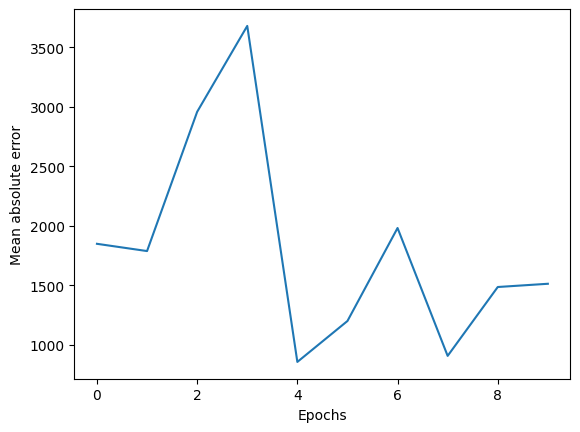

857.1676578521729


In [62]:
def grapher(epochs, trainloader, testloader):
    ep=[]
    err=[]
    for epoch in range(epochs):
        ep.append(epoch)
        i=0
        for data in trainloader:
            inputs, labels = data['features'].to(DEVICE) , data['labels'].unsqueeze(1).to(DEVICE)

            optimizer.zero_grad()

            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            i+=1

        error=0.0
        err_abs=0.0
        with torch.no_grad():
            for data in testloader:
                test, labels =  data['features'].unsqueeze(1), data['labels'].unsqueeze(1)
            # calculate outputs by running data through the network
                outputs = net(test)
                predicted = outputs.data
                diff = torch.abs(predicted - labels.unsqueeze(1))
                print(diff)
                z = torch.divide(diff, torch.abs(labels.unsqueeze(1)))
                # print(z)
                error+=z.sum().item()
                err_abs+=((torch.abs(predicted-labels.unsqueeze(1)))).sum().item()
        err.append(err_abs)
        print(error/200, '%')
        print(err_abs/20000)
    plt.plot(ep, err)
    plt.xlabel("Epochs")
    plt.ylabel("Mean absolute error")
    plt.show()
    print(min(err))
         
grapher(epochs, trainloader, testloader)
